In [0]:
##necessary imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
%matplotlib inline

In [0]:
##getting the dataset
from google.colab import files
files.upload()

Saving stack-overflow-tag-prediction.zip to stack-overflow-tag-prediction.zip


{'stack-overflow-tag-prediction.zip': b'PK\x03\x04\x14\x00\x00\x00\x08\x00\xedTzL\x82\xe7\x1eoq\xd1\'\x00<\xeeo\x00\t\x00\x00\x00train.csv\x94\xbd\xebz\xdbX\x92%\xfa\xbf\x9e\x02\xc3\xec.\xc9]"\xe5KfV\xb5&+\xdd2%;\xe9\x92,\xa5(\xd9Y\xa7\xca\x9f\x1b$@\t6\t0\x01P\x97\xfc5\x0fr\xce\xcb\xcd\x93\x9cX+b_@R\xce\xea\xfef*-^@`\xef\xd8qY\xb1"\xa2-\xday\xbe\xd7\xa6\xd7\xcd\x1f~\xaa\xee\x92\xb6J\xb2:\xbdK\xd2\xa4i\xd3\xe9\x97<K\xb2\xaa]\xce\xab6)\xca\xe4\xe2\xe5\xde?v\xea\x9d\x8f\x7fX<4\xbf\xce\x93&\x9f\xe7\xd36I\xe7\xf3\xa4\xce\xa7U\x9d5\xc9\xddM^\xe7\xf2\xe5,m\xf3\xb6X\xe4\xc9\xac\xc8\xe7YR4\xc9<o\x9a\xa4\xbdIK\\z\x99O\x0by\'Kn\xd3\xf9*\xdf\xeb\xfdcgy\xb3\xdc\xd9Kvx\xe1\x9d\x8f=w/m^/\x8aR.\x96\xdc\x15eV\xdd5\xc9\xf2\xa6*\xf3\xe4/\x83gI\xba\\\xca\xedL\xbf\x91\xfb\xb9\xce\xdbd\xba\xaa\xeb\xbcl\x13\xfel\x11\xfd\xcc4\x99V\xab\xb2\xad\x1f\x92\xdb"M>\xff\xba\xca\xeb\x07\xfc\xe4\xe7\xf46m\xa6u\xb1l\xf1\xcb\xfa:~zX\x95\xb3\xe2zU\x17\xe5urY-\xa6i\x8b;\xb9j\xf2d<>\xd9\xd3\xef\xc9o\x1e\xde\xe5M%?U\xe6M+O\xd

In [0]:
##unzipping the dataset
!unzip stack-overflow-tag-prediction.zip

Archive:  stack-overflow-tag-prediction.zip
  inflating: train.csv               


In [0]:
##Loading the dataset
train = pd.read_csv("train.csv")
train.head()

,title,tags
0,How to draw a stacked dotplot in R?,['r']
1,mysql select all records where a datetime fiel...,"['php', 'mysql']"
2,How to terminate windows phone 8.1 app,['c#']
3,get current time in a specific country via jquery,"['javascript', 'jquery']"
4,Configuring Tomcat to Use SSL,['java']


In [0]:
train['cleaned_tags'] = train['tags'].str.replace(r'[\[\]\'\,]','')

In [0]:
train.head()

,title,tags,cleaned_tags
0,How to draw a stacked dotplot in R?,['r'],r
1,mysql select all records where a datetime fiel...,"['php', 'mysql']",php mysql
2,How to terminate windows phone 8.1 app,['c#'],c#
3,get current time in a specific country via jquery,"['javascript', 'jquery']",javascript jquery
4,Configuring Tomcat to Use SSL,['java'],java


In [0]:
##Creating the target dataframe(as its a multilabel problem)
pd.options.display.max_columns = 200

dummy = train['cleaned_tags'].str.get_dummies(' ')

print("The number of unique tags are {}".format(dummy.shape[1]))

dummy.head()


The number of unique tags are 100


,.net,ajax,algorithm,android,angularjs,apache,arrays,asp.net,asp.net-mvc,c,c#,c++,class,cocoa-touch,codeigniter,css,csv,database,date,datetime,django,dom,eclipse,entity-framework,excel,facebook,file,forms,function,generics,google-maps,hibernate,html,html5,image,ios,iphone,java,javascript,jquery,json,jsp,laravel,linq,linux,list,loops,maven,mongodb,multithreading,mysql,node.js,numpy,objective-c,oop,opencv,osx,pandas,parsing,performance,php,pointers,python,python-2.7,python-3.x,qt,r,regex,rest,ruby,ruby-on-rails,ruby-on-rails-3,selenium,servlets,session,sockets,sorting,spring,spring-mvc,sql,sql-server,string,swift,swing,twitter-bootstrap,uitableview,unit-testing,validation,vb.net,visual-studio,visual-studio-2010,wcf,web-services,windows,winforms,wordpress,wpf,xaml,xcode,xml
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
##is there any null values
train.isnull().sum()

title    0
tags     0
dtype: int64

In [0]:
##is there any duplicate rows
print(train.shape)
train = train.drop_duplicates()
train.shape
##we had a duplicate

(100000, 3)


(99999, 3)

In [0]:
##Lets check the distribution of each tags 
tot_tags = ' '.join(train['cleaned_tags'])
tot_tags = ','.join(tot_tags.split())

'r php mysql c# javascript jquery java ruby-on-rails ruby ruby-on-rails-3 json ruby java spring spring-mvc php codeigniter java class javascript jquery html ios javascript jquery c++ eclipse javascript python list ios objective-c ios json swift c# xaml c# asp.net c# wpf multithreading python ruby php image codeigniter java performance javascript jquery twitter-bootstrap c# linq python xml c# python python numpy javascript jquery ruby javascript jquery ajax json c# json django javascript java multithreading php jquery ajax laravel javascript jquery ajax r java android rest c++ c# asp.net asp.net-mvc web-services c# linq javascript string java excel python c# mysql winforms java php mysql c# asp.net asp.net-mvc java arrays php java python c++ c sockets ruby-on-rails osx c php laravel c# asp.net entity-framework javascript c# linq list mongodb javascript html java json javascript jquery android c++ opencv php c# wpf ios xcode swift uitableview c++ c algorithm javascript php javascript aja

In [0]:
##Calling counter
from collections import Counter,OrderedDict
counting = Counter(tot_tags.split(','))
count_dict = OrderedDict(counting.most_common(50))

/usr/local/lib/python3.6/dist-packages/seaborn/categorical.py:1428: FutureWarning: remove_na is deprecated and is a private function. Do not use.
  stat_data = remove_na(group_data)


Text(0.5, 1.0, 'Distributon of MOST COMMON TAGS UNSED(50)')

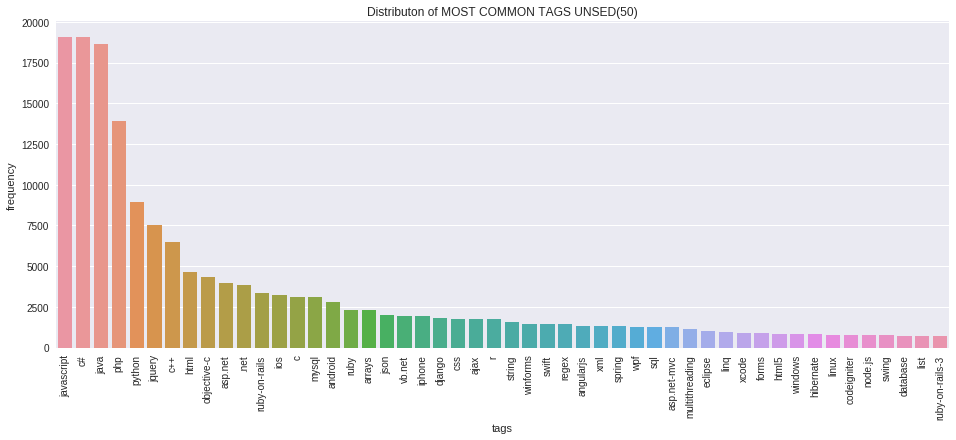

In [0]:
##getting the keys and values
key = []
vals = []
for i,j in zip(count_dict.keys(),count_dict.values()):
    key.append(i)
    vals.append(j)
    
plt.figure(figsize = (16,6))
sns.set(color_codes = True)
sns.barplot(x = key,y = vals)
plt.xticks(rotation = 90)
plt.xlabel('tags')
plt.ylabel('frequency')
plt.title("Distributon of MOST COMMON TAGS UNSED(50)")

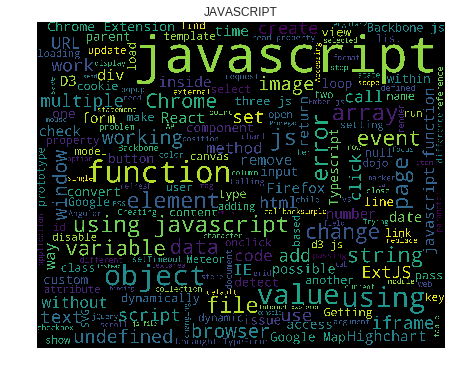

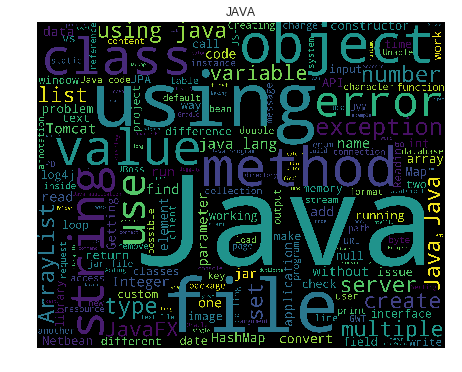

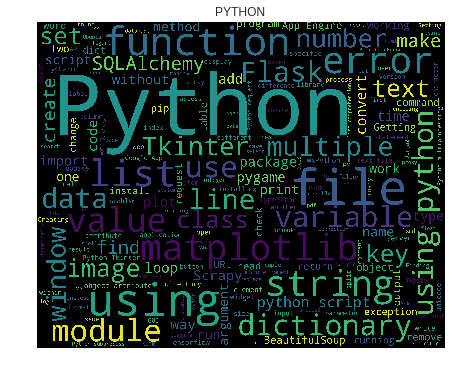

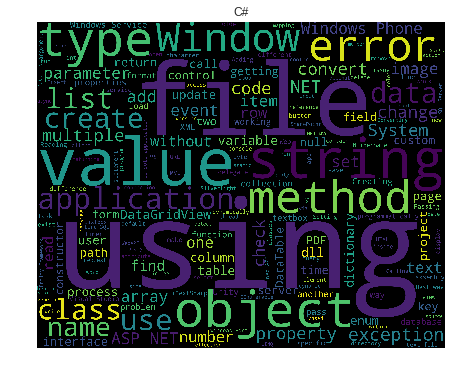

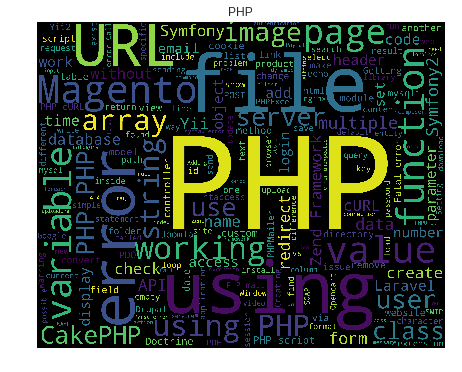

In [0]:
##Visualization

##Plotting the word cloud for javascript.

from wordcloud import WordCloud

def word_cloud(tag):
    '''
    This function plots the wordcloud for the respective tag
    
    arguments:--
    tag is a string .
    returns the wordcloud
    '''
    plt.figure(figsize = (16,6))
    string = pd.Series(train['title'].loc[(train['cleaned_tags'] == tag)]).str.cat(sep = ' ')
    wc = WordCloud(width = 5000,height = 4000).generate(string)
    plt.imshow(wc)
    plt.axis('off')
    plt.title(tag)
    plt.show()
    
    
for tag in ['javascript','java','python','c#','php']:
    word_cloud(tag)


# Custom Word Embedding using GENSIM  

In [0]:
##Necessary imports

import multiprocessing
import re
import os
import json
import gensim.models.word2vec as w2v
import sklearn.manifold as mf
import tensorflow as tf


In [0]:
##Preparing the text corpus
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords

stop_words = set(stopwords.words("english")) 
lemmatizer = WordNetLemmatizer()


def clean_text(text):
    text = re.sub(r'[^\w\s]','',text, re.UNICODE)
    text = text.lower()
    text = [lemmatizer.lemmatize(token) for token in text.split(" ")]
    text = [lemmatizer.lemmatize(token, "v") for token in text]
    text = [word for word in text if not word in stop_words]
    text = " ".join(text)
    return text

train['new_title'] = train['title'].apply(lambda x: clean_text(x))

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [0]:
##Tokenizing the words
train['new_title'] = train['new_title'].map(lambda z: z.split())
train['new_title'].head()

0                            [draw, stack, dotplot, r]
1    [mysql, select, record, datetime, field, le, s...
2                  [terminate, window, phone, 81, app]
3    [get, current, time, specific, country, via, j...
4                        [configure, tomcat, use, ssl]
Name: new_title, dtype: object

In [0]:
##Defining the word2vec model

##HYPERPARAMETERS
num_features = 300
min_word_count = 3
num_workers = multiprocessing.cpu_count()
context_size = 4
downsampling = 1e-3
seed = 1

##Model definition
model2vec = w2v.Word2Vec(sg = 1,
                        seed = seed,
                        workers = num_workers,
                        size = num_features,
                        min_count = min_word_count,
                        window = context_size,
                        sample = downsampling)

##building the vocab

titles = list(train['new_title'])
model2vec.build_vocab(titles)

##Training the model
model2vec.train(titles,total_examples = model2vec.corpus_count,epochs = 100)

##saving the model
model2vec.save('embedding_index.bin')

Text(0.5, 1.0, 'Word Embeddings')

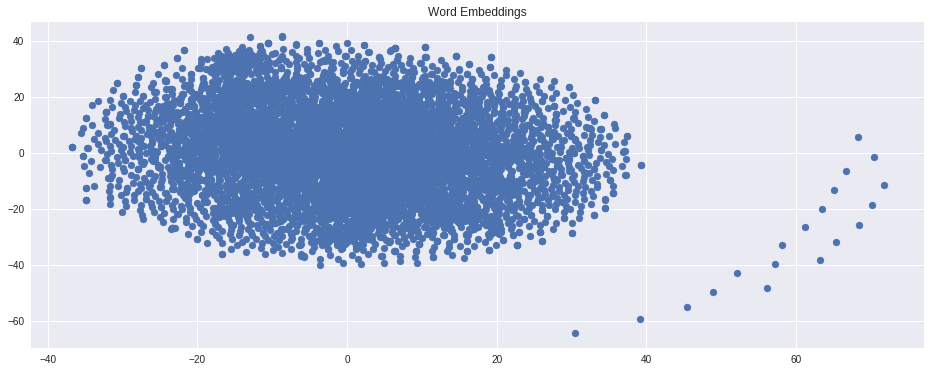

In [0]:
##Plotting using TSNE
tsne = mf.TSNE(n_components = 2,random_state = 0)
matrix = model2vec.wv.vectors
matrix_2d = tsne.fit_transform(matrix)

points = pd.DataFrame([(word,coords[0],coords[1]) 
                      for word,coords in [(word,matrix_2d[model2vec.wv.vocab[word].index])
                                         for word in model2vec.wv.vocab]],
                      columns = ['word','x','y'])

plt.figure(figsize = (16,6))
plt.scatter(points['x'],points['y'])

plt.title("Word Embeddings")

# Model Definition

In [0]:
##Loading the trained word2vec model
embedding = w2v.Word2Vec.load('embedding_index.bin')

In [0]:
##Seperating the dataset
X = train['title'].values
y = dummy.values
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.10,random_state = 1001)
print("shape of X_train is {} and y_train is {}".format(X_train.shape,y_train.shape))
print("shape of X_test is {} and y_test is {}".format(X_test.shape,y_test.shape))

shape of X_train is (89999,) and y_train is (89999, 100)
shape of X_test is (10000,) and y_test is (10000, 100)


In [0]:
##Loading the embedding
MAX_NB_WORDS = len(model2vec.wv.vocab)

##seq length got from "train['title'].map(lambda z: len(z.split())).mean()"
max_seq_length = 10

##text preprocessing
from keras.preprocessing.text import Tokenizer
max_words = 100000
##on train
tokenizer = Tokenizer(num_words = max_words,lower = True,oov_token = 'UNK')
tokenizer.fit_on_texts(X_train)
word_ids = tokenizer.word_index
print(word_ids)

##on test
tokenizer_test = Tokenizer(num_words = max_words,lower = True,oov_token = 'UNK')
tokenizer_test.fit_on_texts(X_test)
word_ids_test = tokenizer_test.word_index

{'UNK': 1, 'to': 2, 'in': 3, 'a': 4, 'how': 5, 'the': 6, 'of': 7, 'with': 8, 'and': 9, 'from': 10, 'c': 11, 'using': 12, 'is': 13, 'on': 14, 'not': 15, 'for': 16, 'java': 17, 'i': 18, 'php': 19, 'an': 20, 'file': 21, 'javascript': 22, 'error': 23, 'get': 24, 'python': 25, 'string': 26, 'array': 27, 'data': 28, 'jquery': 29, 'when': 30, 'do': 31, 'value': 32, 'can': 33, 'net': 34, 'function': 35, 'or': 36, 'object': 37, 'class': 38, 'use': 39, 'list': 40, 'method': 41, 'multiple': 42, 'if': 43, 'into': 44, 'text': 45, 'by': 46, 'it': 47, 'does': 48, 'page': 49, 'image': 50, 'what': 51, 'as': 52, 'form': 53, 'json': 54, 'create': 55, 'html': 56, 'why': 57, 'type': 58, 'rails': 59, 'mysql': 60, 'code': 61, 'set': 62, 'asp': 63, 'add': 64, 'database': 65, 'server': 66, 'working': 67, 'android': 68, 'convert': 69, '2': 70, 'variable': 71, 'values': 72, 'application': 73, 'js': 74, 'change': 75, 'way': 76, 'one': 77, 'button': 78, 'find': 79, 'my': 80, 'after': 81, 'all': 82, 'django': 83, '

In [0]:
##converting the training data to the sequence of word indices:
seq_train = tokenizer.texts_to_sequences(X_train)
seq_test  = tokenizer_test.texts_to_sequences(X_test)

In [0]:
##padding the semtences so as to make them equal sized.
from keras.preprocessing.sequence import pad_sequences
text_data = pad_sequences(seq_train,max_seq_length,truncating="pre")
text_data_test = pad_sequences(seq_test,max_seq_length,truncating="pre")

In [0]:
WV_DIM = 300
nb_words = min(MAX_NB_WORDS, max_words)
word_vectors = model2vec.wv
# we initialize the matrix with random numbers
wv_matrix = (np.random.rand(nb_words, WV_DIM) - 0.5) / 5.0
for word, i in word_ids.items():
    if i >= MAX_NB_WORDS:
        continue
    try:
        embedding_vector = word_vectors[word]
        # words not found in embedding index will be all-zeros.
        wv_matrix[i] = embedding_vector
    except:
        pass        

In [0]:
##model building
from keras.layers import Dense, Input, CuDNNLSTM, Embedding, Dropout,SpatialDropout1D, Bidirectional
from keras.models import Model
from keras.optimizers import Adam
from keras.layers.normalization import BatchNormalization

In [0]:

##initializing the embedding layer
wv_layer = Embedding(nb_words,
                     WV_DIM,
                     mask_zero=False,
                     weights=[wv_matrix],
                     input_length=max_seq_length,
                     trainable=False)

# Inputs
text_input = Input(shape=(max_seq_length,), dtype='int32')
embedded_sequences = wv_layer(text_input)

# biLSTM-1
embedded_sequences = SpatialDropout1D(0.2)(embedded_sequences)
x = Bidirectional(CuDNNLSTM(32, return_sequences=False))(embedded_sequences)

# Dense-1
x2 = Dropout(0.2)(x)
x2 = BatchNormalization()(x2)
x2 = Dense(265, activation='relu')(x2)

# output
x3 = Dropout(0.2)(x2)
x3 = BatchNormalization()(x3)
pred = Dense(100,activation = 'sigmoid')(x3)


# build the model
model = Model(inputs=[text_input], outputs=pred)
model.compile(loss='binary_crossentropy',
              optimizer=Adam(lr=0.001, clipnorm=.25, beta_1=0.7, beta_2=0.99),
              metrics=['accuracy'])

# getting the summary
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_8 (InputLayer)         (None, 10)                0         
_________________________________________________________________
embedding_8 (Embedding)      (None, 10, 300)           2184900   
_________________________________________________________________
spatial_dropout1d_9 (Spatial (None, 10, 300)           0         
_________________________________________________________________
bidirectional_9 (Bidirection (None, 64)                85504     
_________________________________________________________________
dropout_8 (Dropout)          (None, 64)                0         
_________________________________________________________________
batch_normalization_7 (Batch (None, 64)                256       
_________________________________________________________________
dense_7 (Dense)              (None, 265)               17225     
__________

In [0]:
##Fitting the model
history = model.fit([text_data], y_train, validation_split=0.09,
                 epochs=10, batch_size=32, shuffle=True)

Train on 81899 samples, validate on 8100 samples
Epoch 1/10
81899/81899 [==============================] - 39s 474us/step - loss: 0.0783 - acc: 0.9732 - val_loss: 0.0424 - val_acc: 0.9874
Epoch 2/10
81899/81899 [==============================] - 37s 454us/step - loss: 0.0450 - acc: 0.9869 - val_loss: 0.0399 - val_acc: 0.9880
Epoch 3/10
64704/81899 [======================>.......] - ETA: 7s - loss: 0.0429 - acc: 0.9874

In [0]:
##Prediction 
y_pred = model.predict(text_data_test)

In [0]:
model.evaluate([text_data_test],y_test)

10000/10000 [==============================] - 1s 102us/step


0.11540536272525788